In [1]:
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
from utils.masks import extract_masks, binarize, resample_mask
from utils.images import normalize, resample_img
from utils.registration import est_lin_transf, apply_lin_transf, est_nl_transf, apply_nl_transf, seg_atlas
from utils.plot_methods import plot_transf, plot_atlas_seg

## Project 2

### Task 1 Atlas Creation

In [15]:
## Extract masks for common dataset

# Lists of masks
masks = ['./data/common_40_mask.nii.gz',
         './data/common_41_mask.nii.gz',
         './data/common_42_mask.nii.gz']

mov_masks_paths = ['./data/g1_53_mask_3_1.nii.gz',
                  './data/g1_54_mask_3_1.nii.gz',
                  './data/g1_55_mask_3_1.nii.gz']

# Left femur - label 2, Left hip bone - label 4
labels = [2] 

# Extract masks
extract_masks(mov_masks_paths, labels)

The new mask is saved as './data/g1_53_mask_3_1_2.nii.gz'.
The new mask is saved as './data/g1_54_mask_3_1_2.nii.gz'.
The new mask is saved as './data/g1_55_mask_3_1_2.nii.gz'.


Text(0.5, 1.0, 'Image and the new mask')

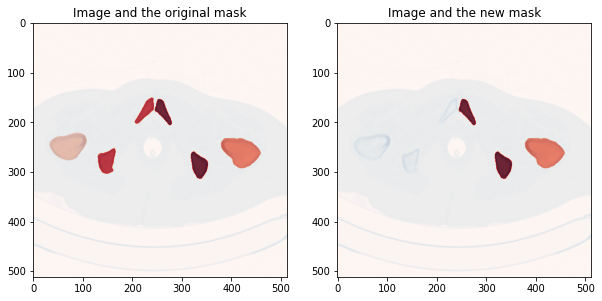

In [3]:
## Plot the extracted masks for one subject

# Load images
fix_img = sitk.ReadImage('./data/common_42_image.nii.gz', sitk.sitkFloat32)
fix_mask = sitk.ReadImage('./data/common_42_mask.nii.gz', sitk.sitkFloat32)
mask_new = sitk.ReadImage('./data/common_42_mask_4_2.nii.gz', sitk.sitkFloat32)

fix_img_data = sitk.GetArrayFromImage(fix_img)
fix_mask_data = sitk.GetArrayFromImage(fix_mask)
mask_new_data = sitk.GetArrayFromImage(mask_new)

# Plot original masks and extracted masks
idx = 30
plt.figure(figsize=(10,20))
plt.subplot(121)
plt.imshow(fix_img_data[idx], cmap='Blues') # fixed image
plt.imshow(fix_mask_data[idx], cmap = 'Reds', alpha = 0.8)
plt.title('Image and the original mask')

plt.subplot(122)
plt.imshow(fix_img_data[idx], cmap='Blues') # fixed image
plt.imshow(mask_new_data[idx], cmap = 'Reds', alpha = 0.8)
plt.title('Image and the new mask')

### Task 3 Atlas based-segmentation: (40%)

#### Linear Registration

### Registration

--------
Linear registration:
Final mean squares value: 127389.27283074906
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 27.
Number of iterations: 27
--------
--------
Demons registration:
Final metric value: 73076.46880102744
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 30.
Number of iterations: 30
--------


/Users/xinyi/Documents/GitHub/Segmentationof-pelvic-bone-in-CT/utils/plot_methods.py:53: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


--------
Linear registration:
Final mean squares value: 124746.73383588629
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 37.
Number of iterations: 37
--------
--------
Demons registration:
Final metric value: 59059.41873869889
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 33.
Number of iterations: 33
--------
--------
Linear registration:
Final mean squares value: 127829.30025009165
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 23.
Number of iterations: 23
--------
--------
Demons registration:
Final metric value: 102588.82901398487
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------


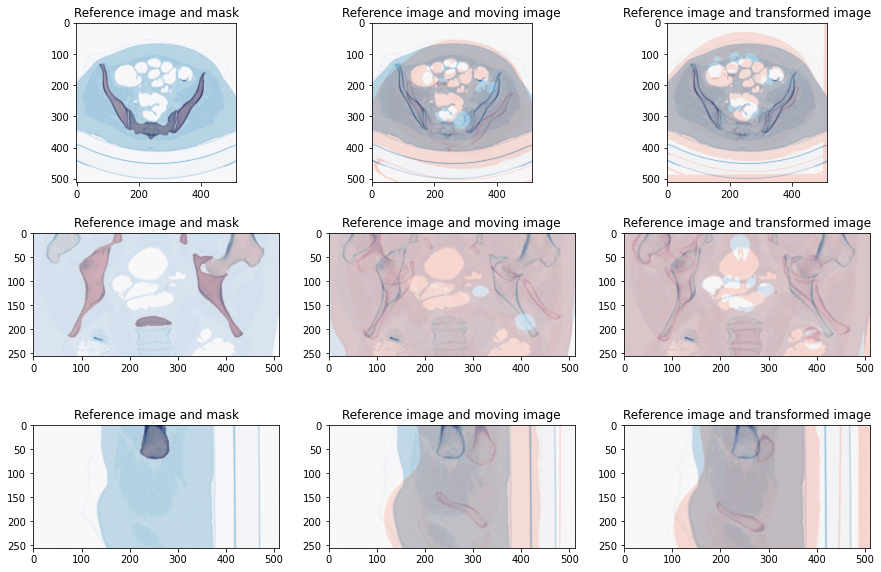

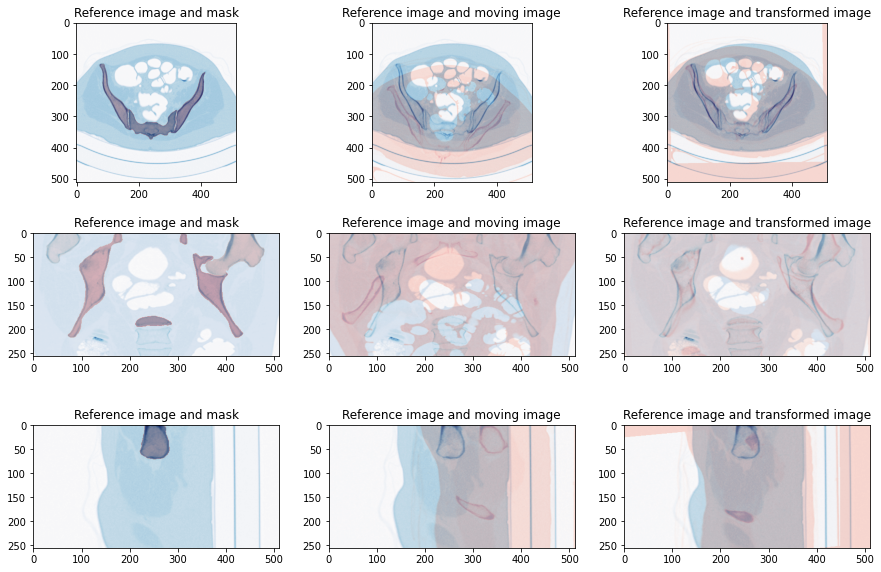

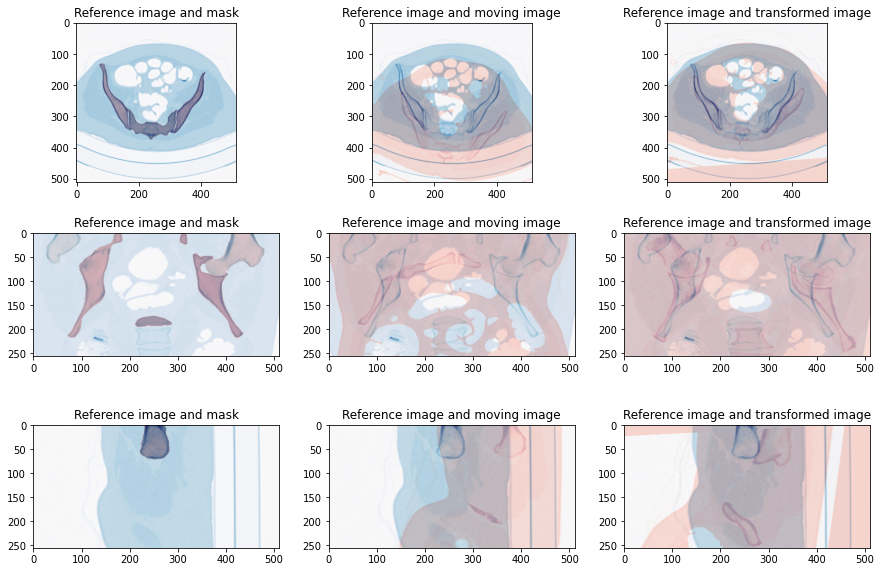

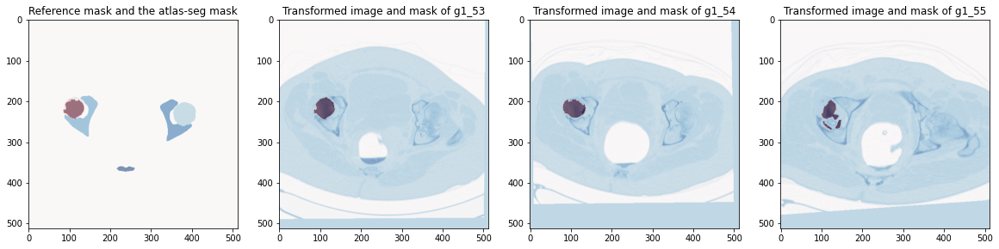

--------
Linear registration:
Final mean squares value: 154091.36760316472
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 27.
Number of iterations: 27
--------
--------
Demons registration:
Final metric value: 91959.38669269261
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 26.
Number of iterations: 26
--------
--------
Linear registration:
Final mean squares value: 153148.1190437469
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 35.
Number of iterations: 35
--------
--------
Demons registration:
Final metric value: 85461.71137425378
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 19.
Number of iterations: 19
--------
--------
Linear registration:
Final mean squares value: 167379.24195546535
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

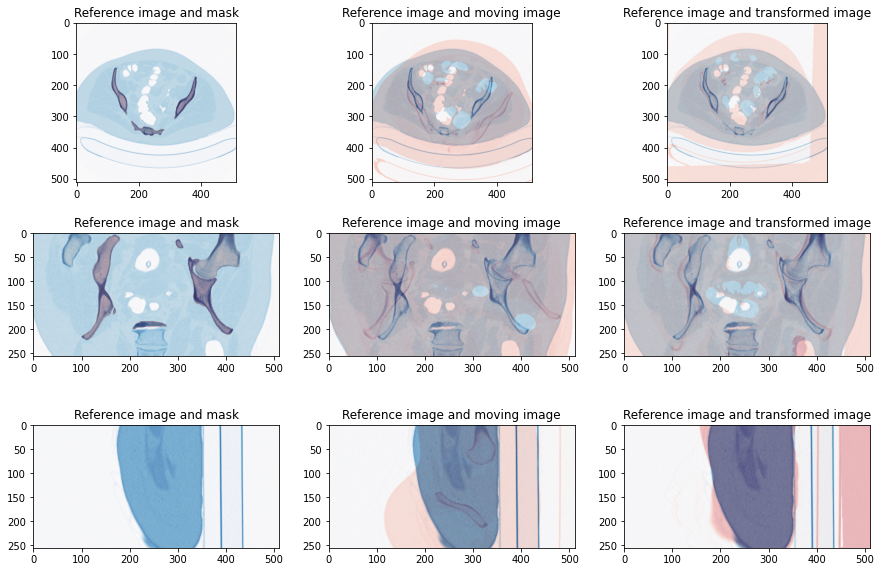

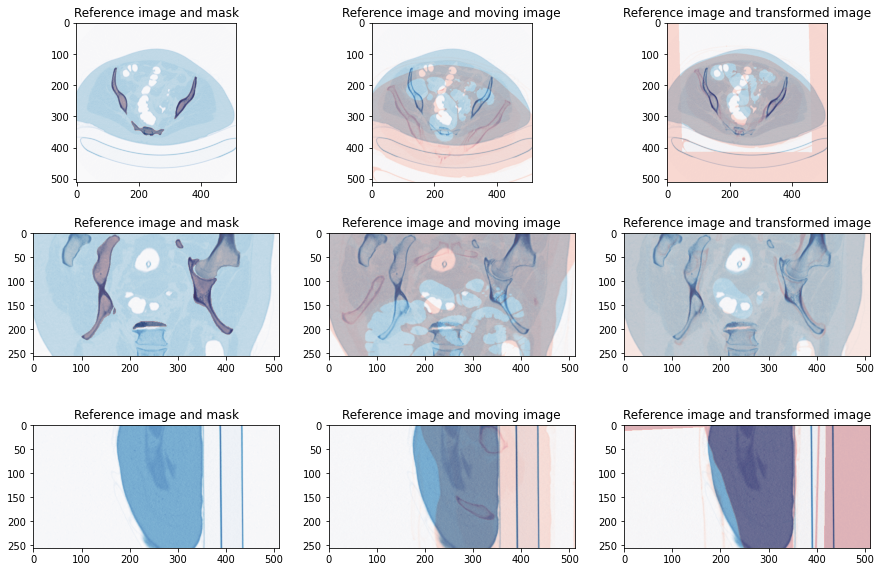

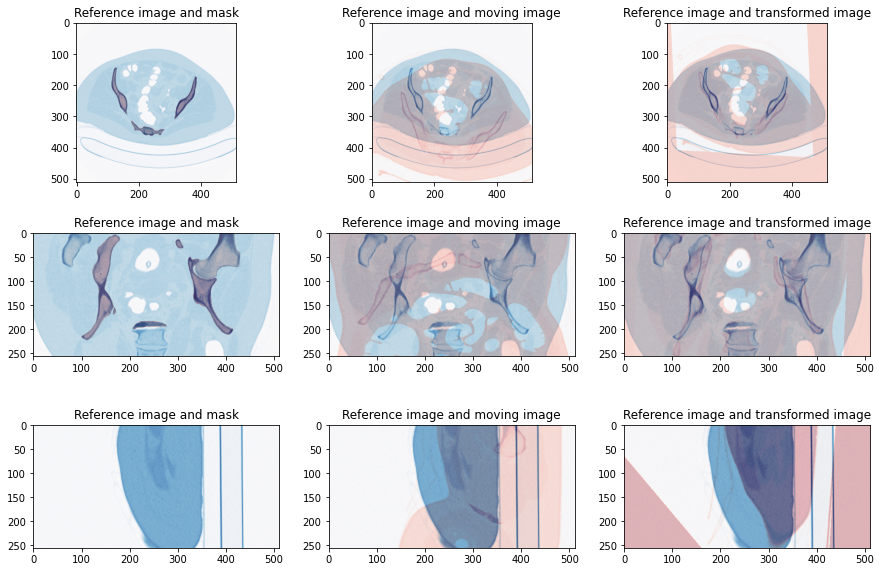

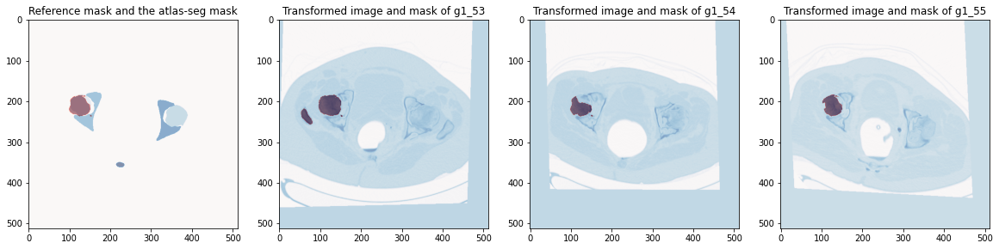

--------
Linear registration:
Final mean squares value: 120022.44979428986
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 33.
Number of iterations: 33
--------
--------
Demons registration:
Final metric value: 50831.68697541971
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 30.
Number of iterations: 30
--------
--------
Linear registration:
Final mean squares value: 136118.18959718026
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 18.
Number of iterations: 18
--------
--------
Demons registration:
Final metric value: 61159.622607951365
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------
--------
Linear registration:
Final mean squares value: 154721.64056921608
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence chec

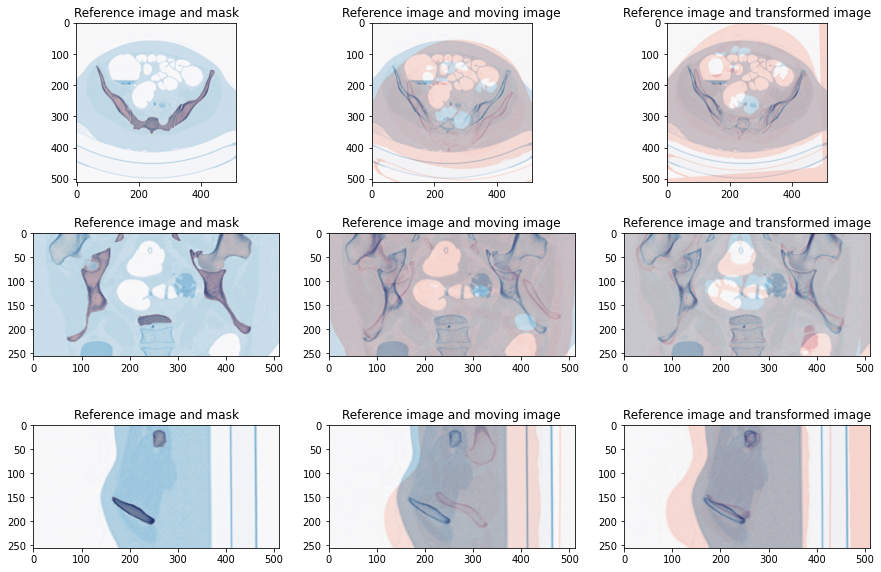

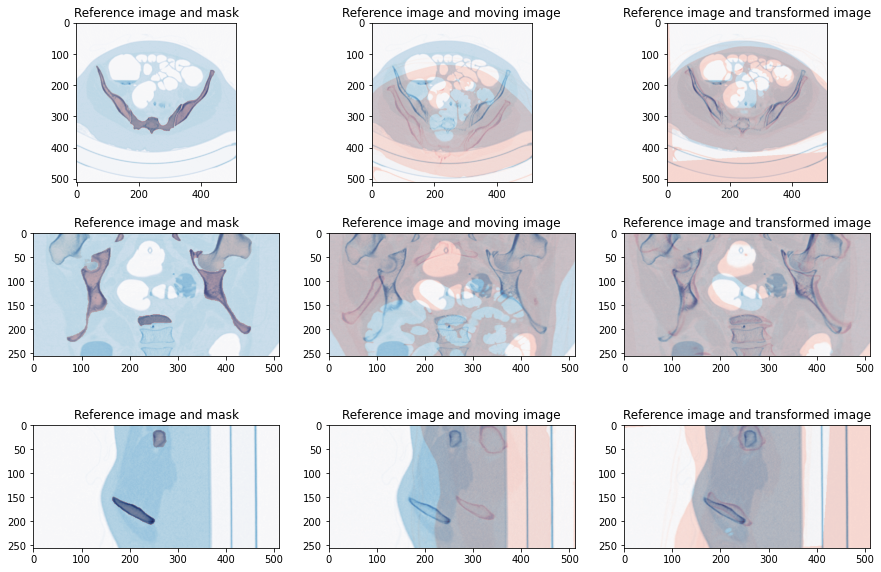

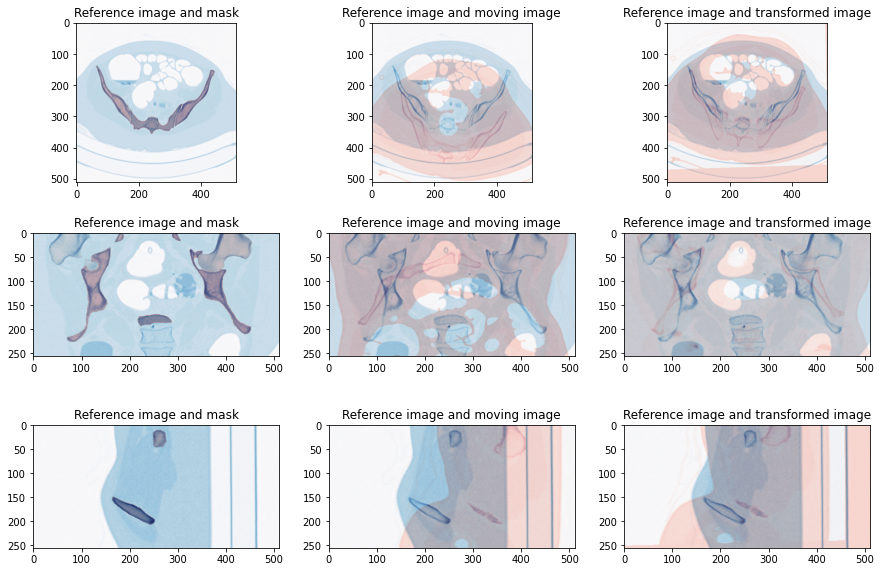

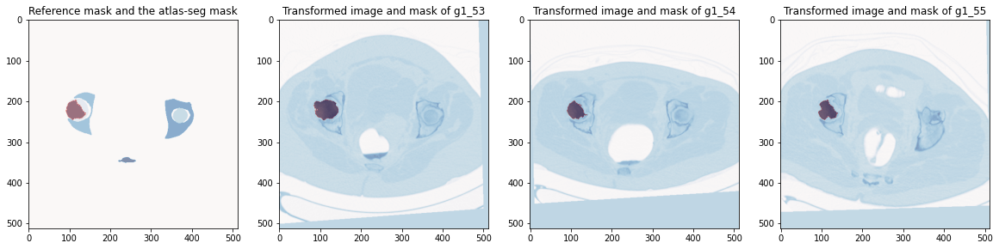

--------
Linear registration:
Final mean squares value: 131776.01338485707
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 43.
Number of iterations: 43
--------
--------
Demons registration:
Final metric value: 81532.45256788567
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 26.
Number of iterations: 26
--------
--------
Linear registration:
Final mean squares value: 121203.24265880125
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 73.
Number of iterations: 73
--------
--------
Demons registration:
Final metric value: 74060.1377890815
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 39.
Number of iterations: 39
--------
--------
Linear registration:
Final mean squares value: 131050.49393205921
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

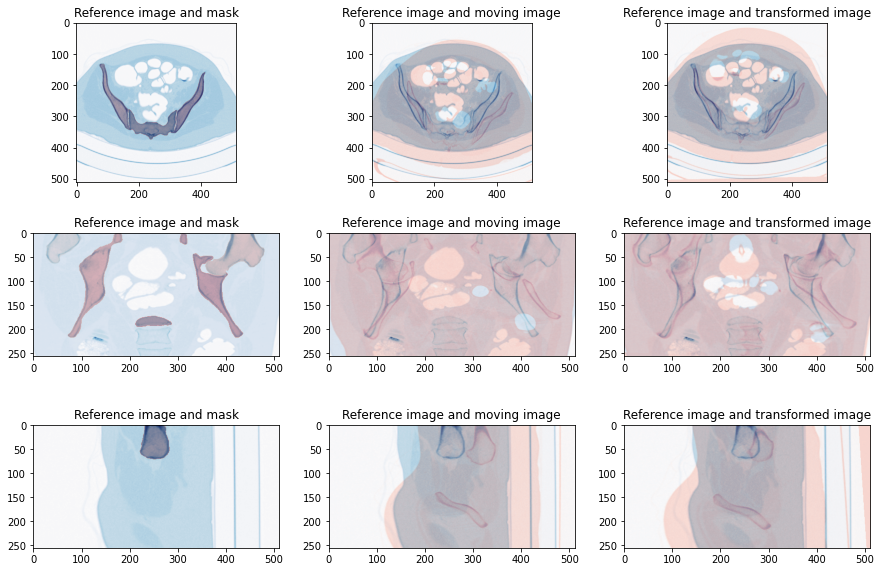

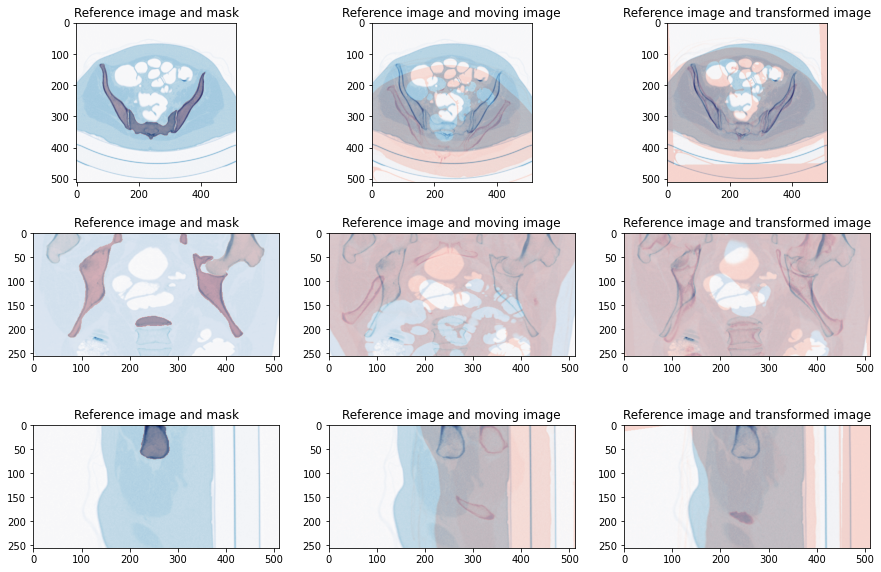

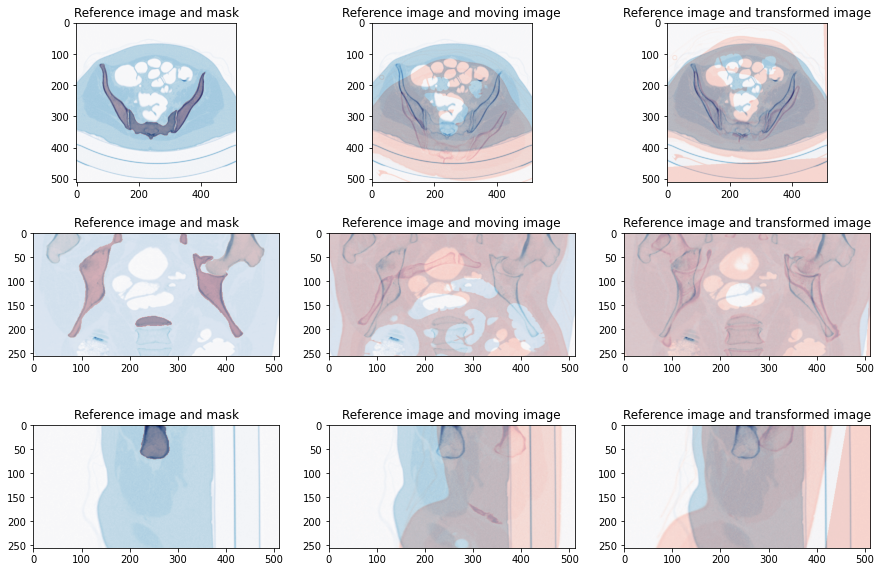

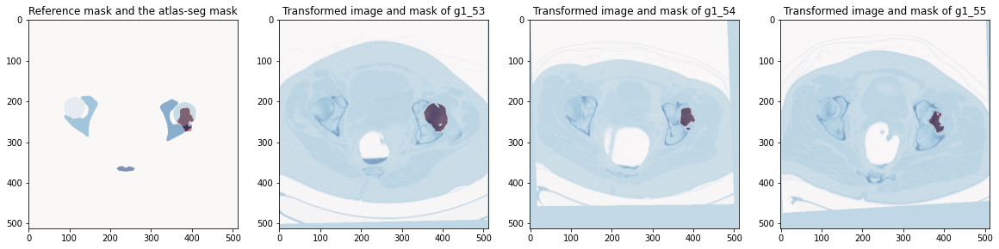

--------
Linear registration:
Final mean squares value: 162965.0530393676
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 24.
Number of iterations: 24
--------
--------
Demons registration:
Final metric value: 123790.62255934527
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 18.
Number of iterations: 18
--------
--------
Linear registration:
Final mean squares value: 145120.0711610196
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 32.
Number of iterations: 32
--------
--------
Demons registration:
Final metric value: 70112.38613688173
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 30.
Number of iterations: 30
--------
--------
Linear registration:
Final mean squares value: 177384.85668639457
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

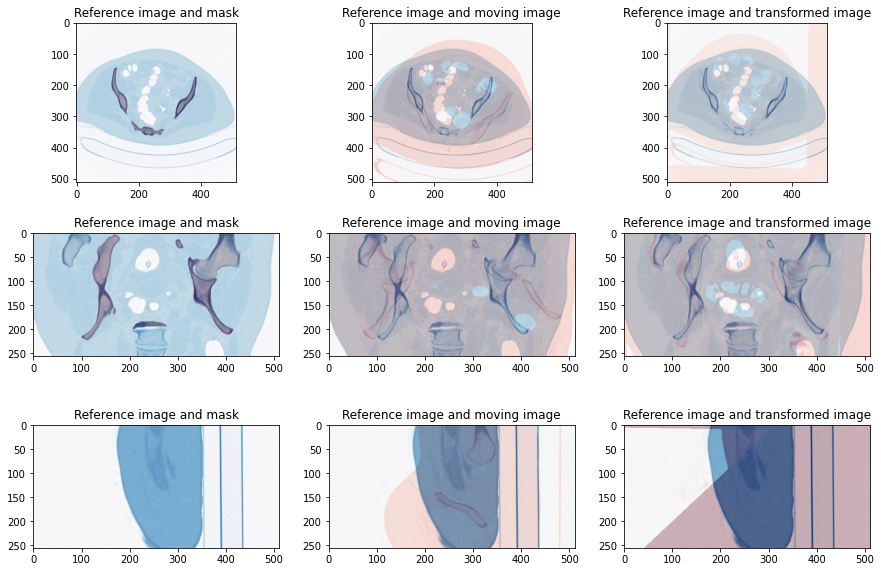

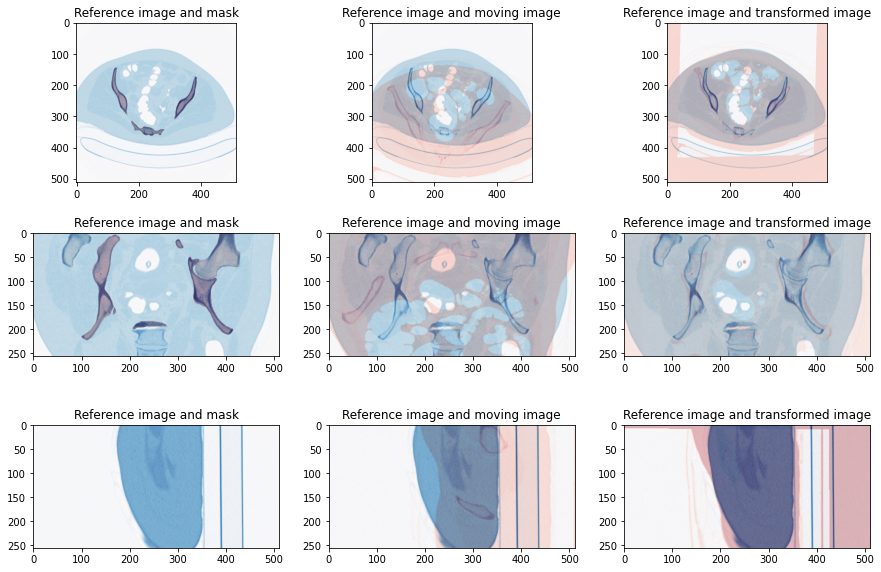

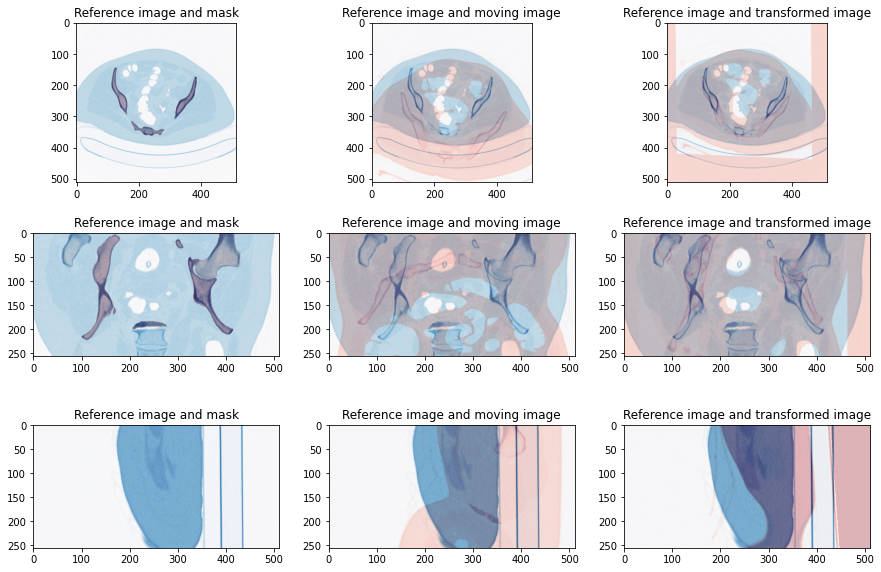

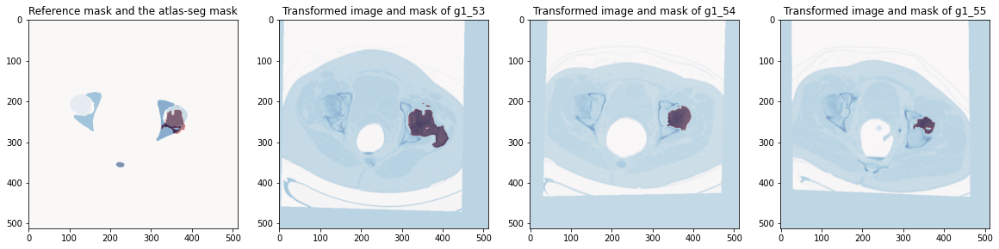

--------
Linear registration:
Final mean squares value: 139613.59780458588
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 42.
Number of iterations: 42
--------
--------
Demons registration:
Final metric value: 59781.83951032625
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 42.
Number of iterations: 42
--------
--------
Linear registration:
Final mean squares value: 124883.60903662202
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 15.
Number of iterations: 15
--------
--------
Demons registration:
Final metric value: 42073.87551260447
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------
--------
Linear registration:
Final mean squares value: 140727.06720768425
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence check

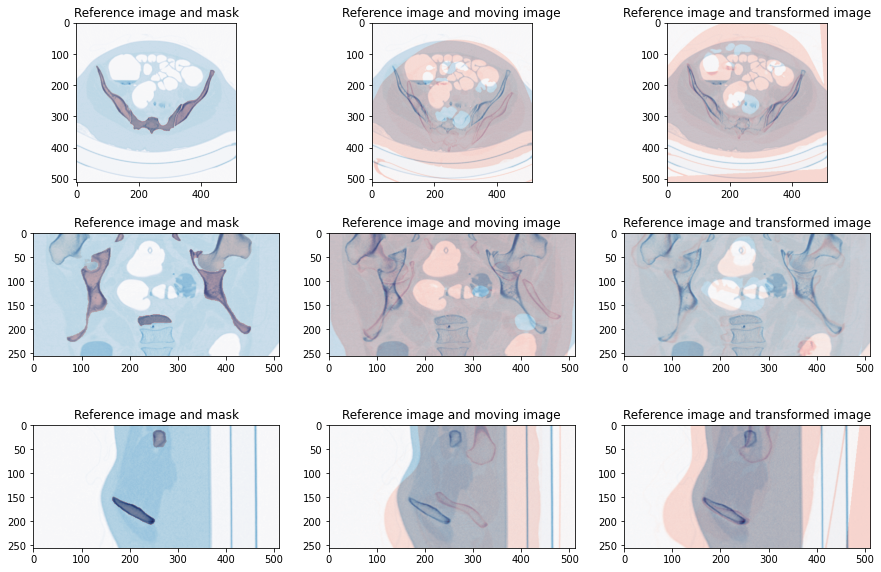

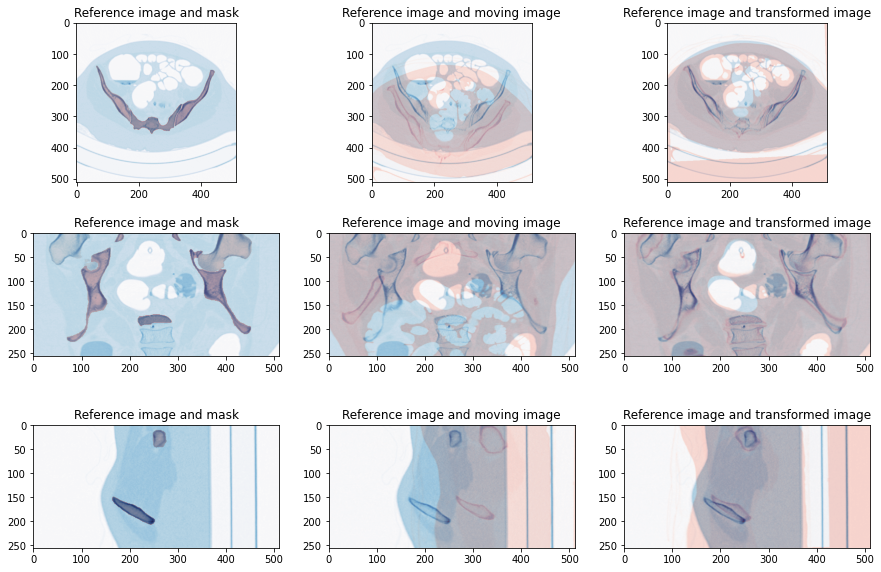

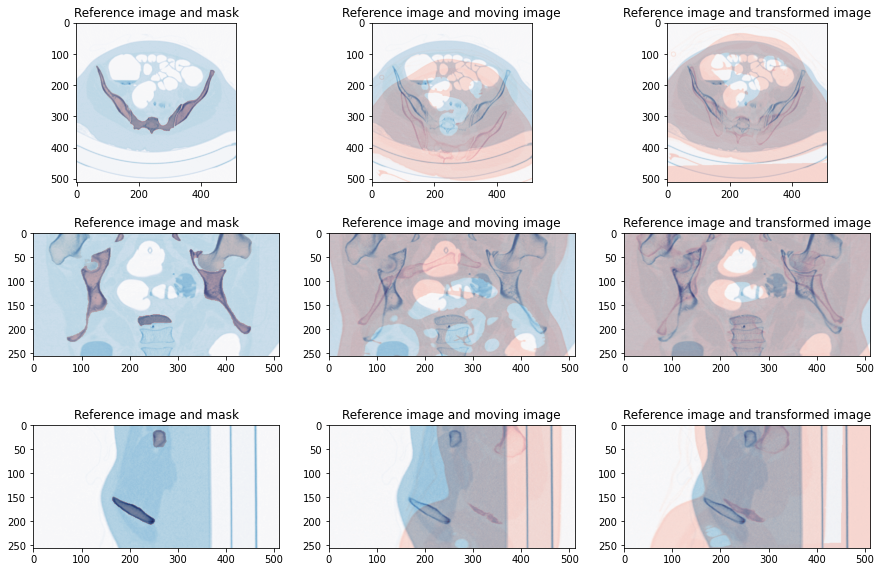

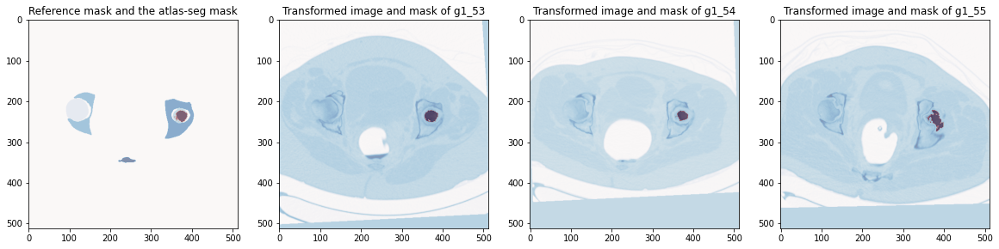

--------
Linear registration:
Final mean squares value: 136655.9622093914
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 14.
Number of iterations: 14
--------
--------
Demons registration:
Final metric value: 95932.95104365695
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 34.
Number of iterations: 34
--------
--------
Linear registration:
Final mean squares value: 135142.76542093622
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 58.
Number of iterations: 58
--------
--------
Demons registration:
Final metric value: 98081.71488568357
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------
--------
Linear registration:
Final mean squares value: 131779.16609678505
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

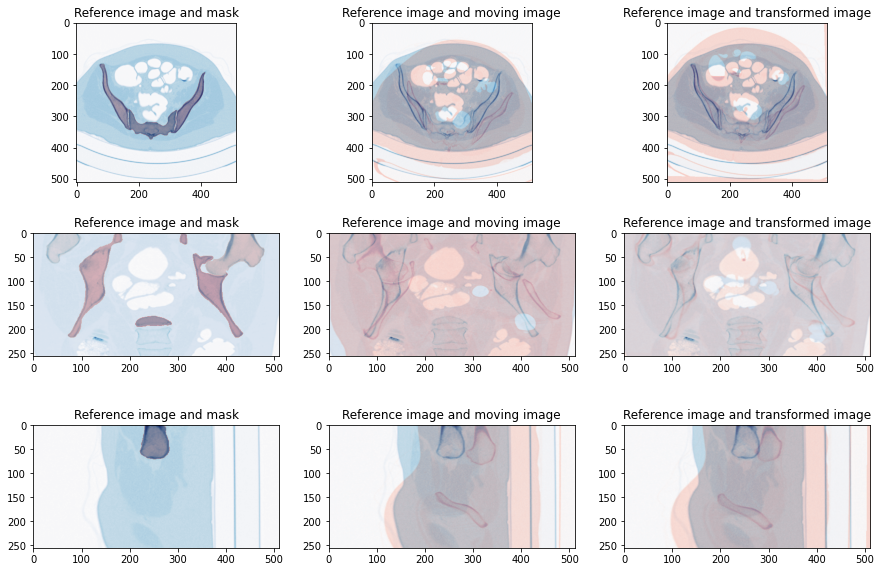

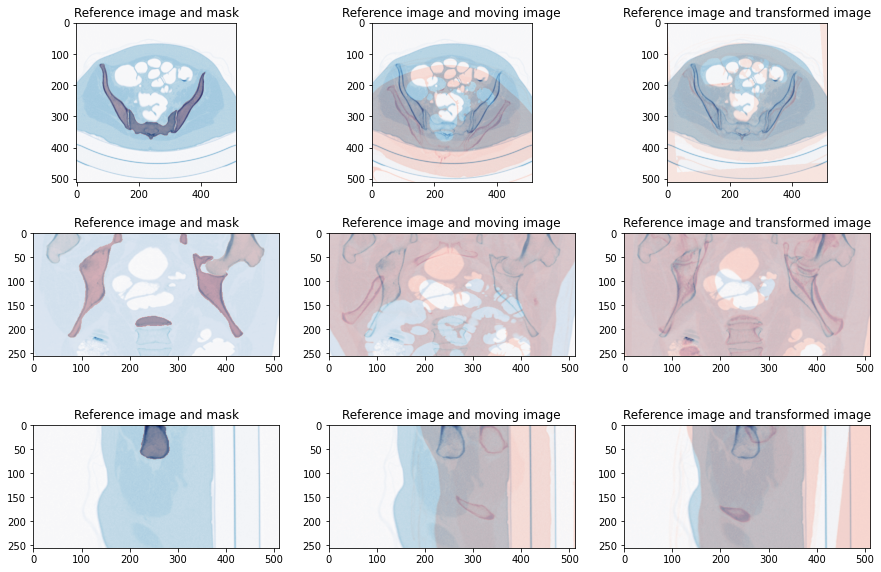

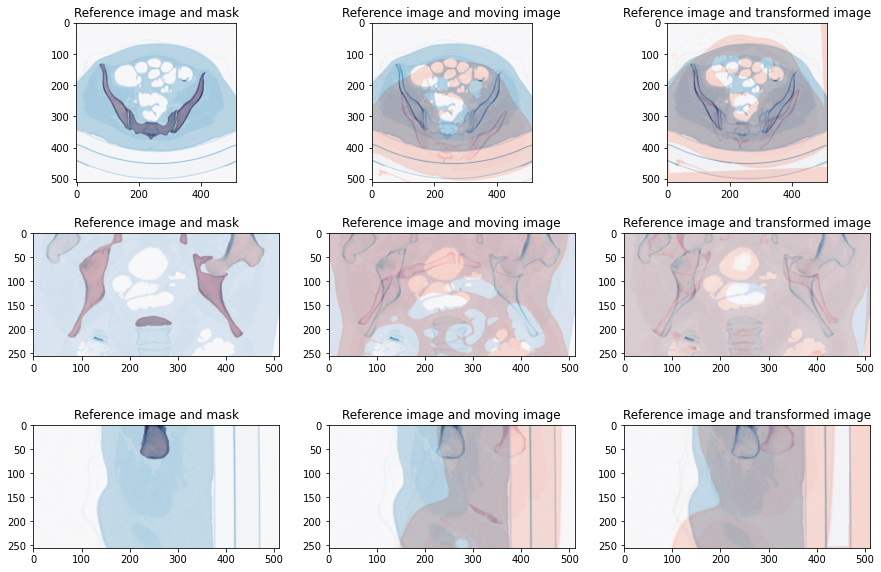

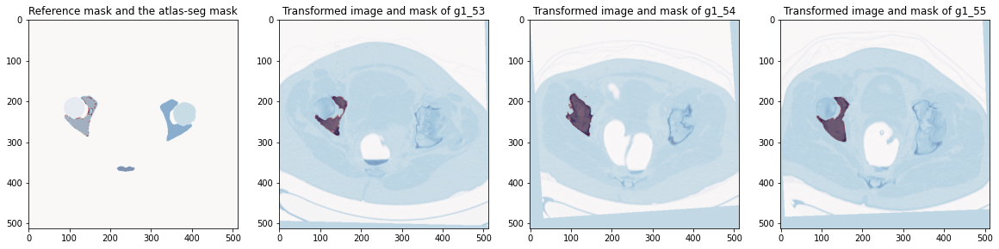

--------
Linear registration:
Final mean squares value: 161905.02880161876
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 56.
Number of iterations: 56
--------
--------
Demons registration:
Final metric value: 116199.00198429162
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 18.
Number of iterations: 18
--------
--------
Linear registration:
Final mean squares value: 153045.86341190268
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 68.
Number of iterations: 68
--------
--------
Demons registration:
Final metric value: 95694.60302894004
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 28.
Number of iterations: 28
--------
--------
Linear registration:
Final mean squares value: 188809.5892828124
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence check

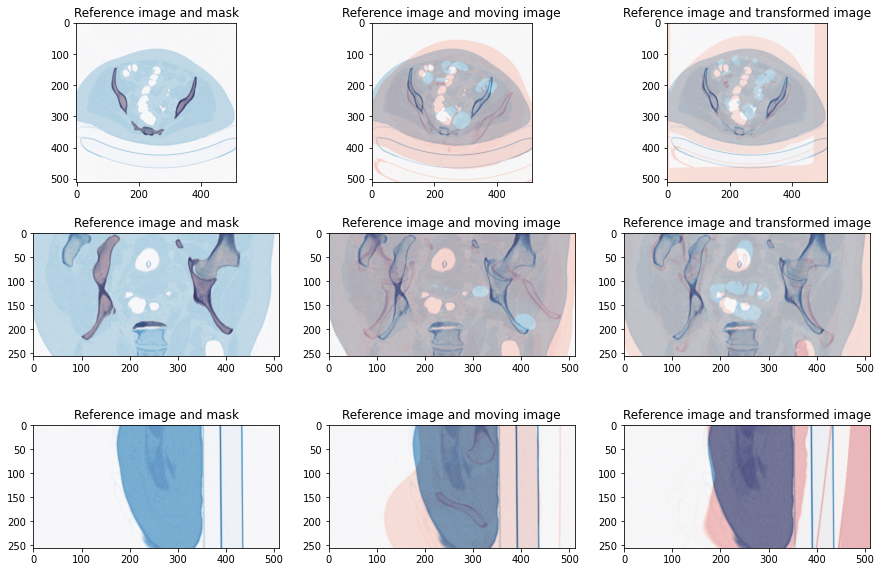

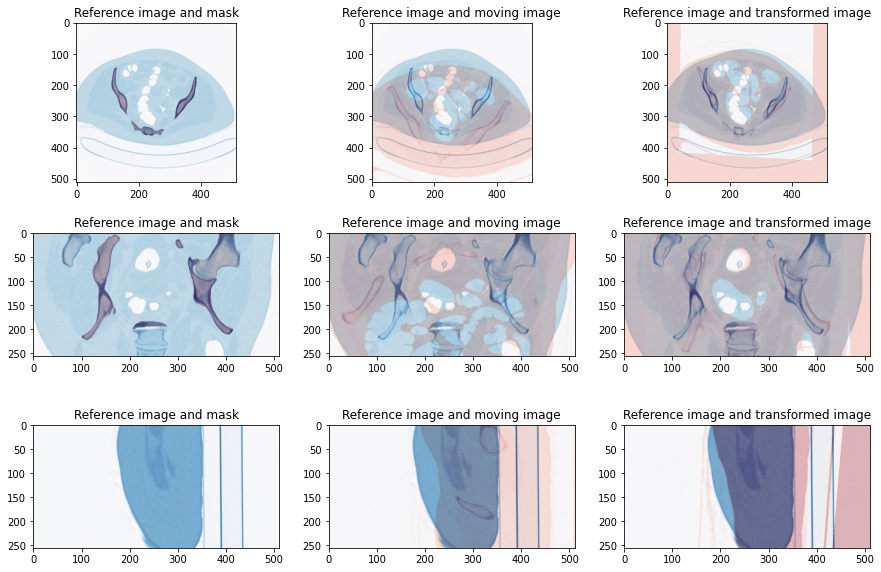

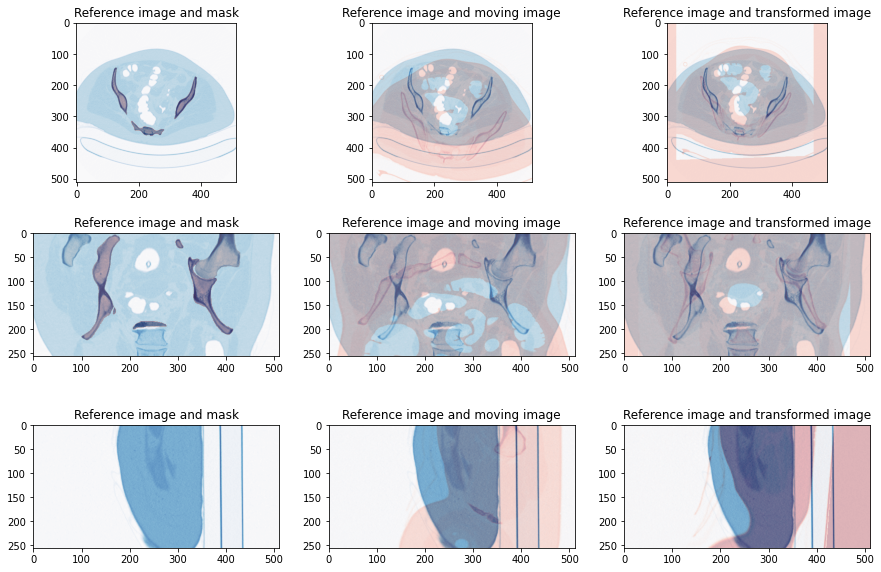

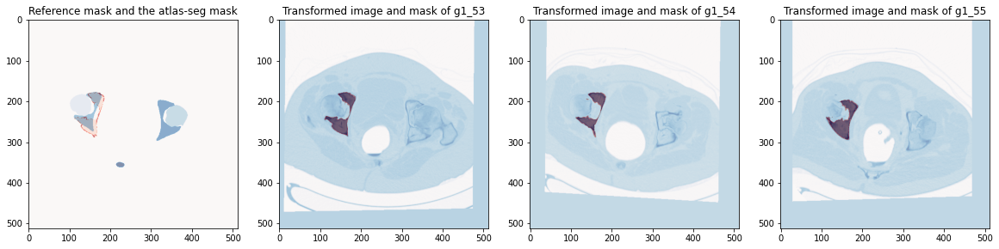

--------
Linear registration:
Final mean squares value: 148158.47052746313
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 18.
Number of iterations: 18
--------
--------
Demons registration:
Final metric value: 93785.15517370896
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 36.
Number of iterations: 36
--------
--------
Linear registration:
Final mean squares value: 139477.3618080106
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 24.
Number of iterations: 24
--------
--------
Demons registration:
Final metric value: 64393.58755073719
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------
--------
Linear registration:
Final mean squares value: 136322.46908392277
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

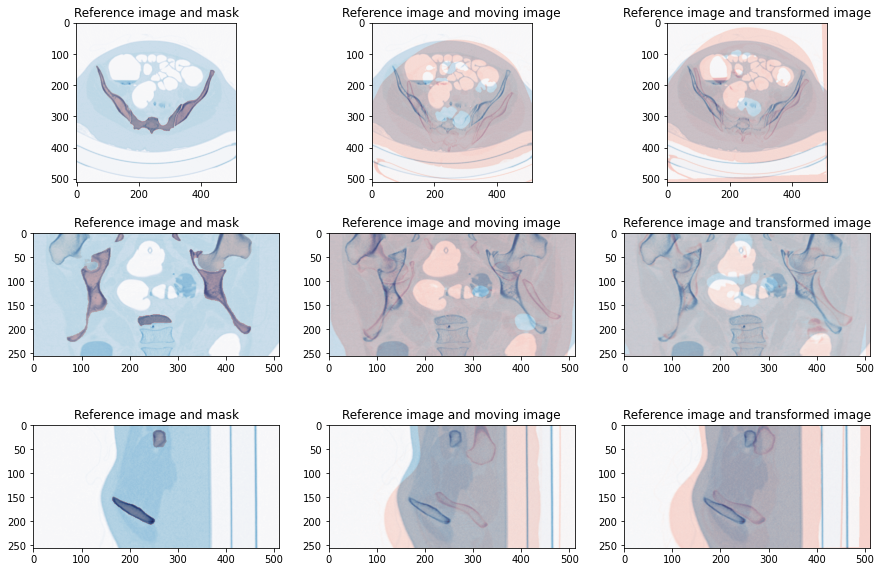

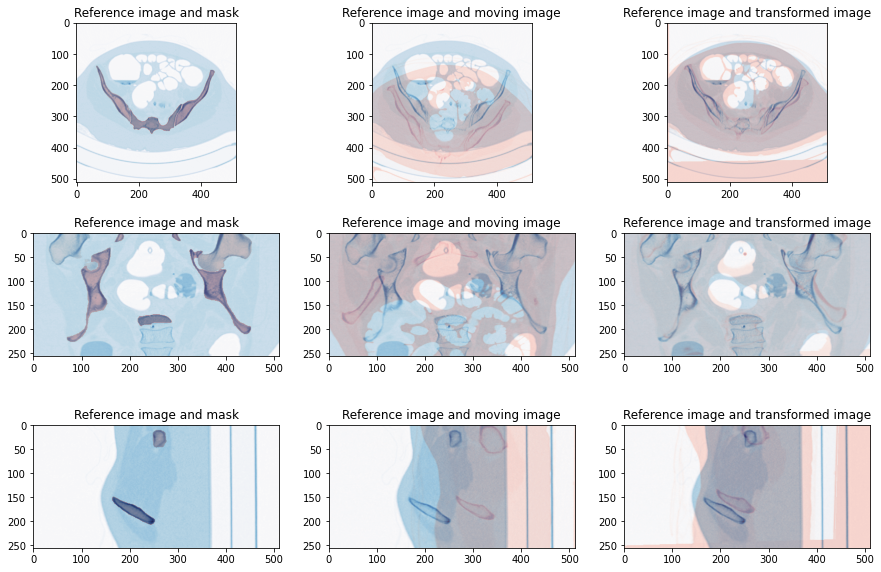

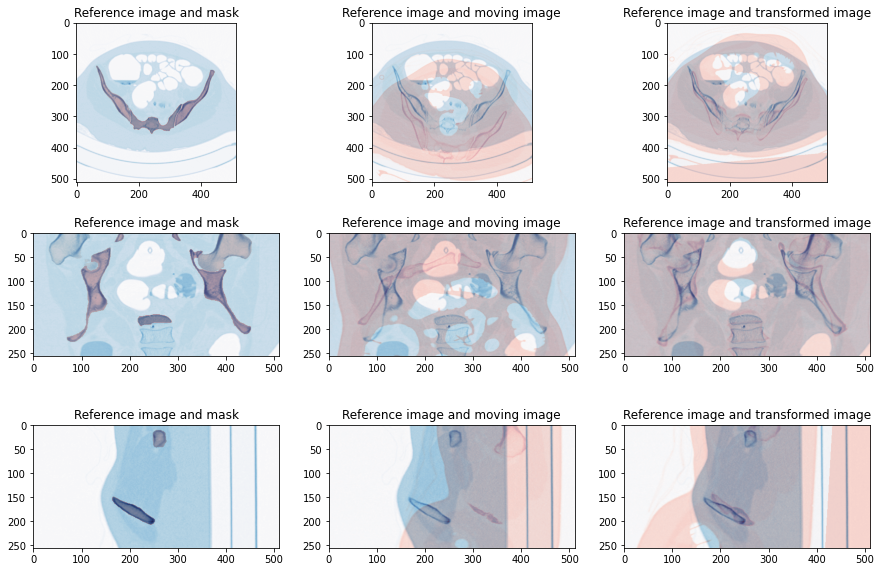

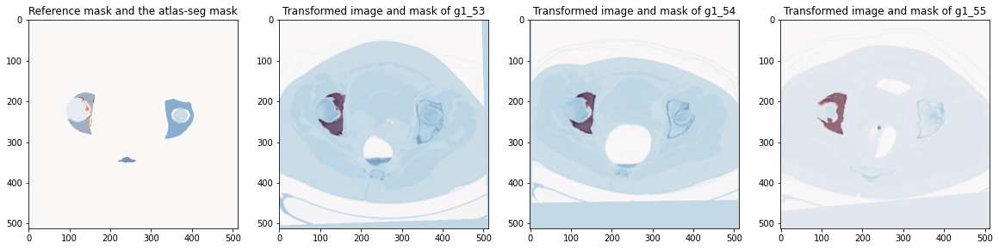

--------
Linear registration:
Final mean squares value: 130590.15839627081
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 39.
Number of iterations: 39
--------
--------
Demons registration:
Final metric value: 83001.10583882581
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 32.
Number of iterations: 32
--------
--------
Linear registration:
Final mean squares value: 126537.79962815605
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 20.
Number of iterations: 20
--------
--------
Demons registration:
Final metric value: 83615.24420882248
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 43.
Number of iterations: 43
--------
--------
Linear registration:
Final mean squares value: 139282.2478322598
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

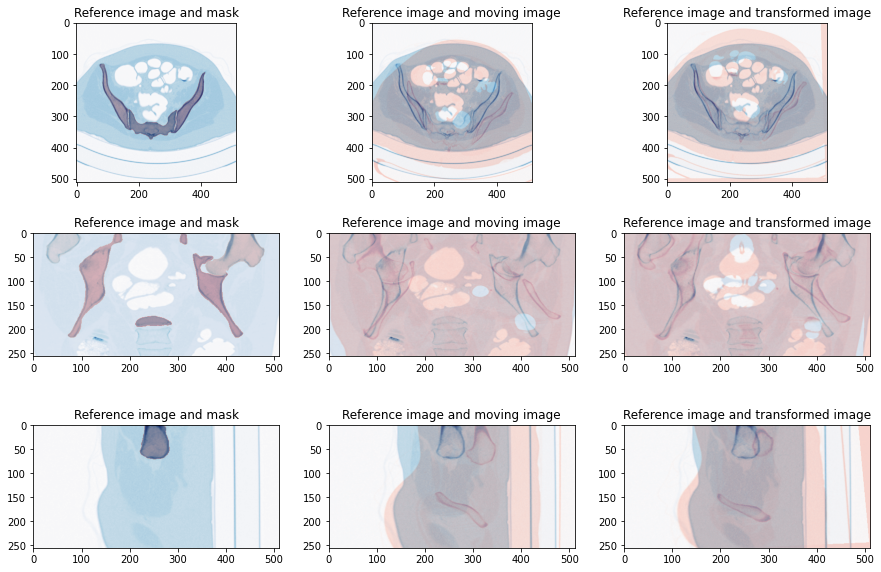

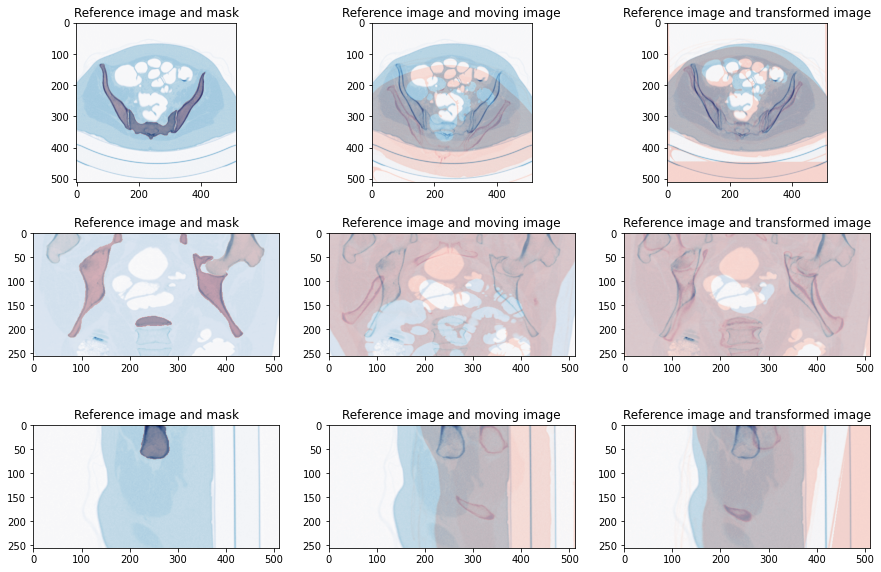

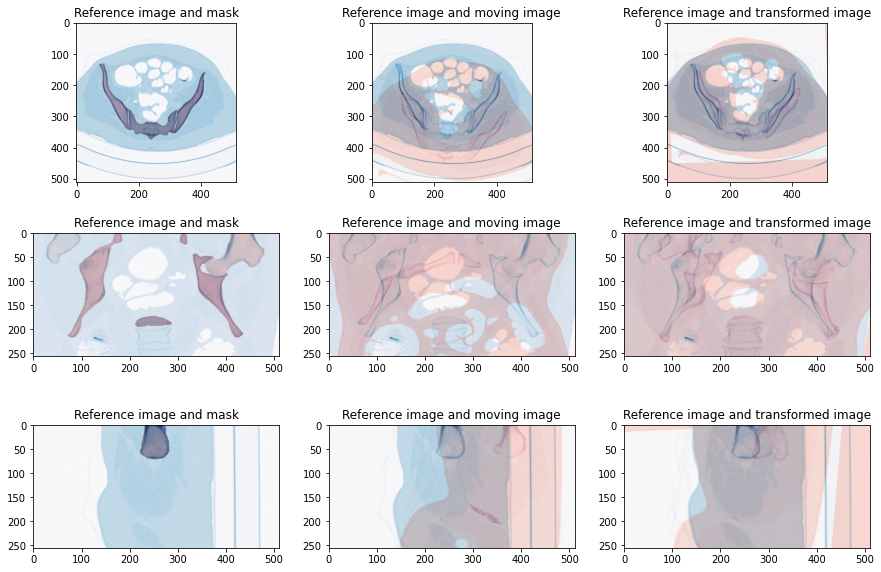

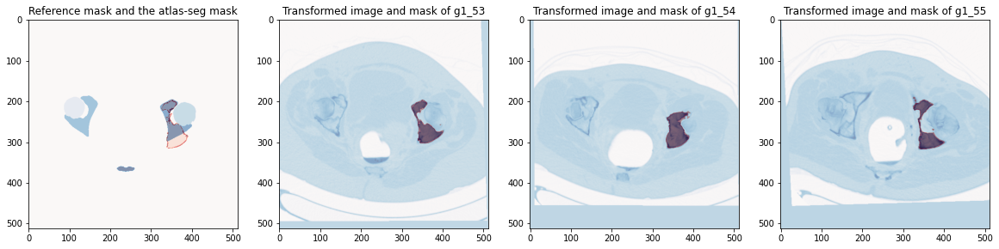

--------
Linear registration:
Final mean squares value: 197555.38564091755
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 21.
Number of iterations: 21
--------
--------
Demons registration:
Final metric value: 172078.95970860537
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 28.
Number of iterations: 28
--------
--------
Linear registration:
Final mean squares value: 153934.43962009085
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 42.
Number of iterations: 42
--------
--------
Demons registration:
Final metric value: 94117.47633369608
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 24.
Number of iterations: 24
--------
--------
Linear registration:
Final mean squares value: 157115.99856089044
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence chec

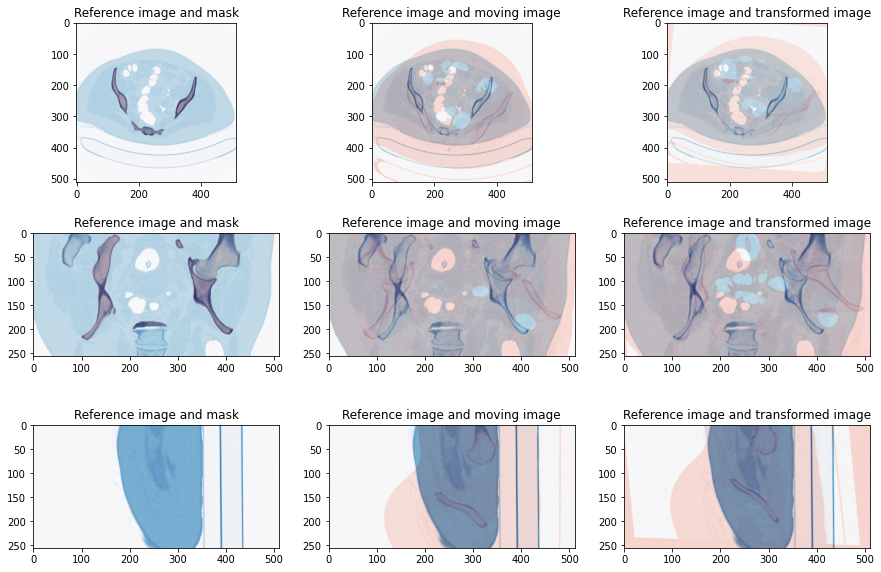

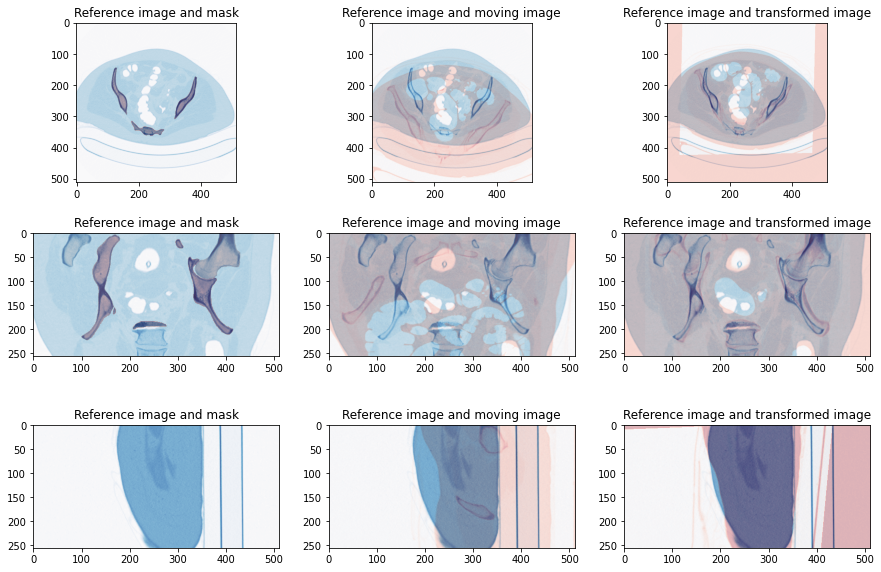

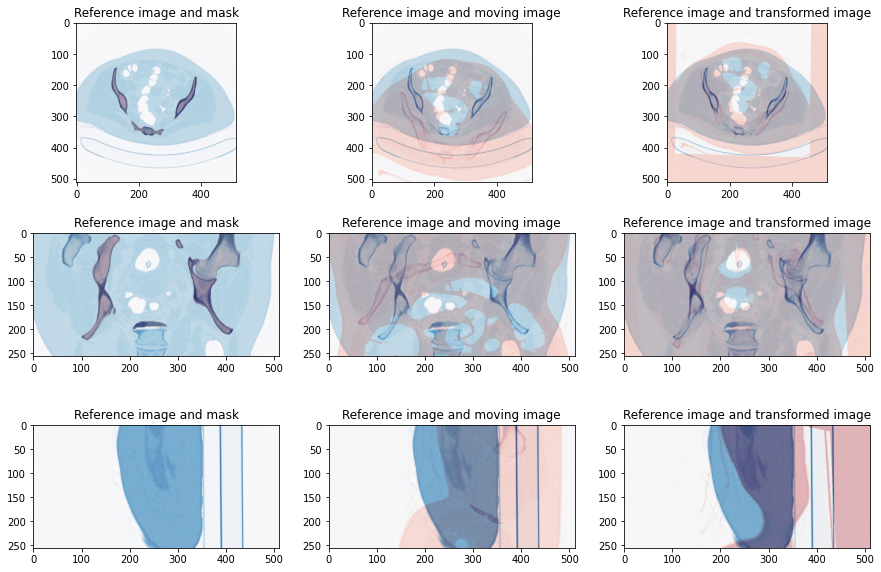

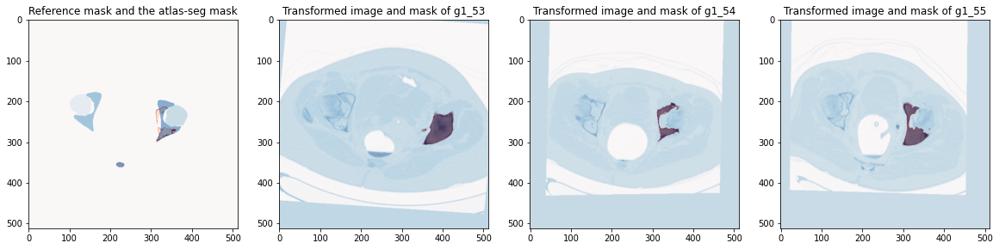

--------
Linear registration:
Final mean squares value: 109965.82638576257
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 19.
Number of iterations: 19
--------
--------
Demons registration:
Final metric value: 48397.48898077713
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------
--------
Linear registration:
Final mean squares value: 144800.89863929464
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 33.
Number of iterations: 33
--------
--------
Demons registration:
Final metric value: 96047.58614167581
Optimizer stop condition: GradientDescentOptimizerv4Template: Maximum number of iterations (50) exceeded.
Number of iterations: 50
--------
--------
Linear registration:
Final mean squares value: 169377.6576228284
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checke

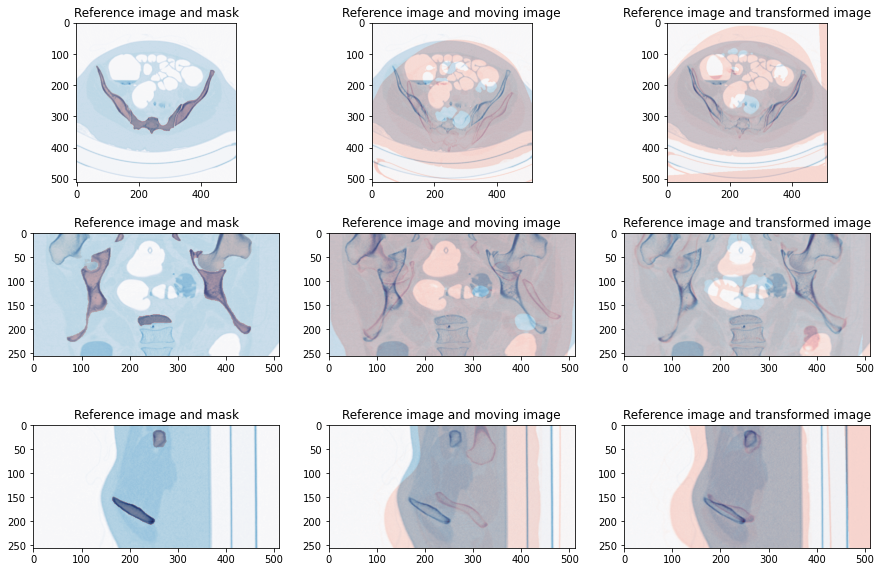

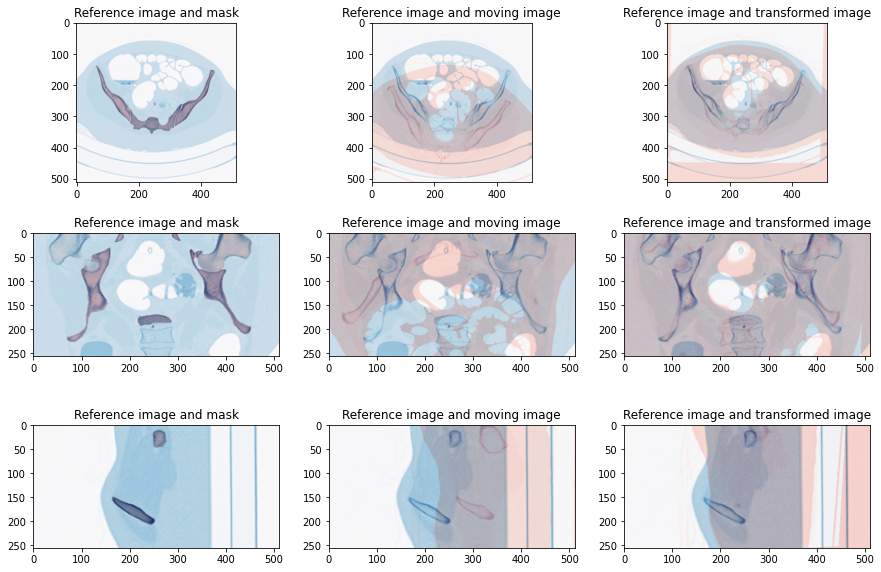

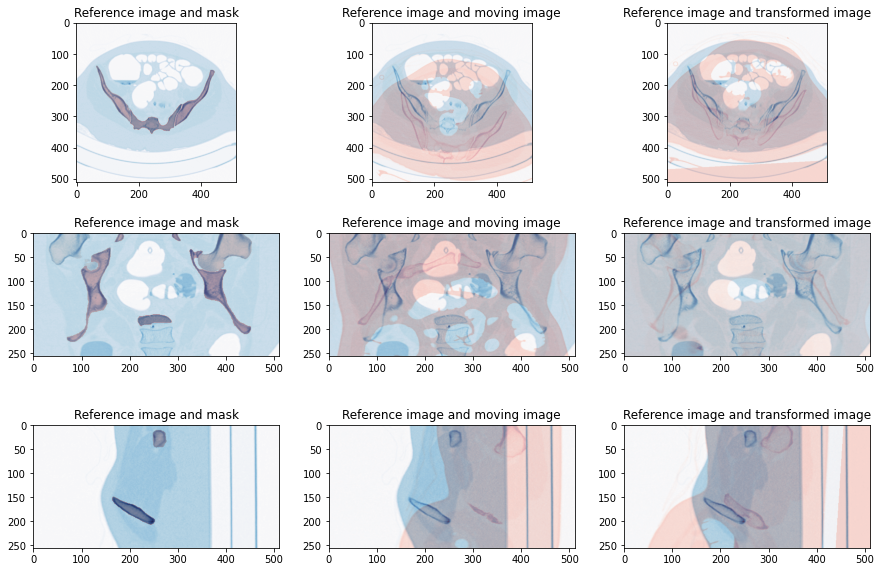

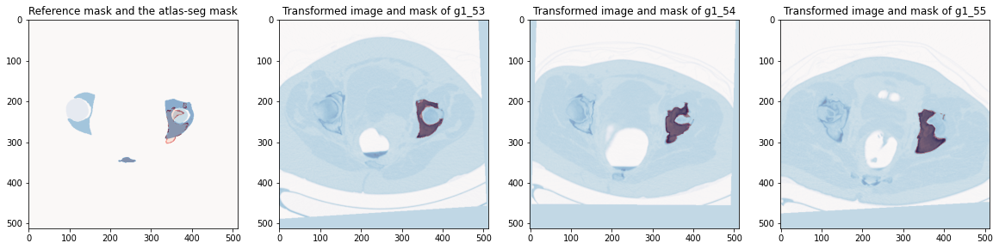

In [2]:
# If resample and normalize the images to be in the same size
resmaple = True
normal = False
bones = ['r_femur', 'l_femur', 'r_hip', 'l_hip']
common = [40, 41, 42]
group = [53, 54, 55]

for id_b in range(len(bones)):

    for i in range(len(common)):

        reg_masks = []
        reg_imgs = []

        # Load reference image and mask
        fix_img = sitk.ReadImage('./data/common_{0}_image.nii.gz'.format(common[i]), sitk.sitkFloat32)
        fix_mask = sitk.ReadImage('./data/common_{0}_mask.nii.gz'.format(common[i], id_b+1), sitk.sitkFloat32)
        
        for j in range(len(group)):
            # Load moving image and mask
            mov_img = sitk.ReadImage('./data/g1_{0}_image.nii.gz'.format(group[j]), sitk.sitkFloat32)
            mov_mask = sitk.ReadImage('./data/g1_{0}_mask_{1}.nii.gz'.format(group[j],id_b+1), sitk.sitkFloat32)

            # Resample the images to be the same size
            # Normalize the images
            # Binarize the mask
            if resmaple:
                fix_img = resample_img(fix_img, out_size= [512,512,256])
                fix_mask = resample_mask(fix_mask, out_size= [512,512,256])
                mov_img = resample_img(mov_img, out_size= [512,512,256])
                mov_mask = resample_mask(mov_mask, out_size= [512,512,256])

            if normal:
                fix_img = normalize(fix_img)
                mov_img = normalize(mov_img)

            # Linear Registration
            lin_transf = est_lin_transf(fix_img, fix_mask, mov_img)
            lin_mov_img = apply_lin_transf(fix_img, mov_img, lin_transf)
            lin_mov_mask = apply_lin_transf(fix_img, mov_mask, lin_transf)

            # Demon Regisrtaion
            nl_transf = est_nl_transf(fix_img, lin_mov_img, fix_mask)
            nl_mov_img = apply_nl_transf(fix_img, lin_mov_img, nl_transf)
            nl_mov_mask = apply_nl_transf(fix_img, lin_mov_mask, nl_transf)

            reg_imgs.append(nl_mov_img)
            reg_masks.append(sitk.Cast(nl_mov_mask,sitk.sitkUInt8))

            # Plot the results
            x,y,z = 140, 250, 450
            plot_transf(fix_img, fix_mask, mov_img, lin_mov_img, x, y, z)

        # Apply atlas segmentation and save the image
        est_lin_mask = seg_atlas(reg_masks)
        est_lin_mask_path = './output/atlas/' + "common_{0}_".format(common[i]) + "fm_lin_est_{}_mask.nii.gz".format(bones[id_b])
        sitk.WriteImage(est_lin_mask, est_lin_mask_path)

        # Plot the atlas segmentation results
        idx = 80
        plot_atlas_seg(est_lin_mask, fix_mask, reg_imgs, reg_masks, idx)
        

In [11]:
lin_transf.GetNumberOfFixedParameters()

3

In [13]:
lin_transf.Get

1

In [12]:
lin_transf.GetNumberOfParameters()

12

### Task 4 Accuracy assessment: (10%)

In [4]:
# Define assesment method
def AccuracyAssess(ref, pred):

    labelTrue=ref
    labelPred=pred
    
    diceCoeff=sitk.LabelOverlapMeasuresImageFilter()
    diceCoeff.Execute(labelTrue>0.5,labelPred>0.5)

    hausDist=sitk.HausdorffDistanceImageFilter()
    hausDist.Execute(labelTrue>0.5,labelPred>0.5)

    print("Dice coefficient equal to ", diceCoeff.GetDiceCoefficient(), "; Hausdorff distance equal to ",  hausDist.GetHausdorffDistance())

In [5]:
for id_b in range(len(bones)): 
    for i in common:
        gt = sitk.ReadImage('./data/common_{0}_mask_{1}.niai.gz'.format(i,id_b+1), sitk.sitkFloat32)
        est_mask = sitk.ReadImage('./output/atlas/common_{0}_fm_lin_est_{1}_mask.nii.gz'.format(i, bones[id_b]), sitk.sitkFloat32)
        gt = resample_mask(gt, out_size= [512,512,256])
        print("Evaluation of the mask for {0} of common {1} :".format(bones[id_b], i))
        AccuracyAssess(gt, sitk.Cast(est_mask,sitk.sitkUInt8))

Evaluation of the mask for r_femur of common 40 :
Dice coefficient equal to  0.8230703257443465 ; Hausdorff distance equal to  13.882296520881244
Evaluation of the mask for r_femur of common 41 :
Dice coefficient equal to  0.791858591918586 ; Hausdorff distance equal to  22.548590754208167
Evaluation of the mask for r_femur of common 42 :
Dice coefficient equal to  0.7585975070889109 ; Hausdorff distance equal to  19.211811356516375
Evaluation of the mask for l_femur of common 40 :
Dice coefficient equal to  0.31243853700003144 ; Hausdorff distance equal to  35.706567088166494
Evaluation of the mask for l_femur of common 41 :
Dice coefficient equal to  0.3446807385071153 ; Hausdorff distance equal to  28.125071526301323
Evaluation of the mask for l_femur of common 42 :
Dice coefficient equal to  0.7496029934489041 ; Hausdorff distance equal to  25.517522372779204
Evaluation of the mask for r_hip of common 40 :
Dice coefficient equal to  0.8322719714731855 ; Hausdorff distance equal to 